# Extracting inormation carrying observed variables with log-linear models based on samples for the observed and latent variables from a deep generative model
In this example for a post-hoc approach, we use samples from trained scVI model to infer the learned connection between observed and latent variables. 

## Loading of packages
First we load some necessary packages and functions.

In [16]:
 using Pkg 
 Pkg.activate(".")
 Pkg.instantiate()

 Activating environment at `~/GitHub/ai-in-human-genomics-dl-omics-review/Project.toml`


In [17]:
installpackages = false
if installpackages
     Pkg.add(Pkg.PackageSpec(;name="Flux", version="0.11.1"))
     Pkg.add(["NNlib","Distances","PyPlot","Clustering","CSV","Cairo","Fontconfig","Gadfly","MultivariateStats","DataFrames","UnicodePlots","PyCall","Serialization","Random","StatsBase","Statistics","TSne","ColorSchemes","VegaLite","Distributions","Distributed","LinearAlgebra"])
     Pkg.add(url="https://github.com/ssehztirom/LogLinearModels.jl")
end

In [18]:
 using DelimitedFiles
 using Statistics
 using CSV
 using LinearAlgebra
 using Clustering
 using Distances
 using StatsBase
 using VegaLite
 using Cairo
 using Fontconfig
 using DataFrames
 using TSne
 using Random
 using LogLinearModels

In [19]:
Pkg.installed()

┌ Warning: Pkg.installed() is deprecated
└ @ Pkg /Users/julia/buildbot/worker/package_macos64/build/usr/share/julia/stdlib/v1.5/Pkg/src/Pkg.jl:554


Dict{String,VersionNumber} with 19 entries:
  "LogLinearModels"   => v"0.1.0"
  "CSV"               => v"0.8.4"
  "Fontconfig"        => v"0.4.0"
  "Distributions"     => v"0.24.18"
  "VegaLite"          => v"2.5.0"
  "ColorSchemes"      => v"3.12.1"
  "PyCall"            => v"1.92.3"
  "TSne"              => v"1.2.0"
  "StatsBase"         => v"0.33.8"
  "MultivariateStats" => v"0.8.0"
  "Flux"              => v"0.11.1"
  "Distances"         => v"0.9.2"
  "PyPlot"            => v"2.9.0"
  "Clustering"        => v"0.14.2"
  "Gadfly"            => v"1.3.2"
  "Cairo"             => v"1.0.5"
  "DataFrames"        => v"1.0.2"
  "UnicodePlots"      => v"1.3.0"
  "NNlib"             => v"0.7.19"

In [21]:
 function annotatesamplesbypattern(traindata,samples,features,originallabels,fillupempty=true)
	trainpatterns = traindata[:,features]
	samplepatterns = samples
	if size(samples,2)> length(features)
		samplepatterns = samples[:,features]
	end
	codes = [join(Int.(trainpatterns[i,:])) for i = 1:size(trainpatterns,1) ]
	codesmap = Dict()
	for i = 1:length(codes)
		codesmap[codes[i]] = originallabels[i]
	end
	samplelabel = fill("XYZ",size(samplepatterns)[1])
	for i = 1:size(samplepatterns)[1]
		newlabel = trykey(join(Int.(samplepatterns[i,:])),codesmap,"")
		samplelabel[i] = newlabel
	end
	if fillupempty
		samplelabel[samplelabel.==""] = [rand(unique(originallabels)) for i = 1:sum(samplelabel.=="")]
	end
	return samplelabel
end

 function trykey(x,dict,returnval = 0)
    if haskey(dict,x)
        return dict[x]
    else
        return returnval
    end
end

function dichotomize(x;selquantile=0.5)
	n,p=size(x)
	dicho = zeros(n,p)
	for i=1:p
		dicho[:,i] = ifelse.(x[:,i] .>quantile(x[:,i],selquantile),1.0,0.0)
	end
	return dicho
end


function evaluatevariable(curset,i,visible_training,hidden_training,visible_test,hidden_test,evolution=false)
	h = size(hidden_training.data)[2]
	scores = zeros(h)
	curx_train = initcurx(curset,visible_training)
	curx_test = nothing
	m0constr = ifelse(length(curset)==0,makeconstraint(curx_train),makeconstraint(curx_train,evolution))
	updatecurx!(curx_train,visible_training,length(curset)+2,i)
	if !isnothing(visible_test)
		curx_test = initcurx(curset,visible_test)
		updatecurx!(curx_test,visible_test,length(curset)+2,i)
	end
	for j=1:h
		updatecurx!(curx_train,hidden_training,1,j)
		if !isnothing(hidden_test)
			updatecurx!(curx_test,hidden_test,1,j)
		end
		scores[j] = gof(curx_train,m0constr,curx_test)
	end
	return scores
end

function select_k_variables(kvariables,sampleset;testtraining=false,newdata=nothing,verbose=true,evolution=false)
	if length(sampleset)==0
		println("sample set is empty")
		error()
	end
	n,p =size(sampleset[1][1].data)
	curset = Int[]
	scores = []
	requiredsets = ifelse(isnothing(newdata),1,ifelse(newdata=="i",kvariables * p,kvariables)) * ifelse(testtraining,2,1)
	if requiredsets > length(sampleset)
		println("number of data sets does not match the requirements")
		error()
	end
	visible_training,hidden_training =pop!(sampleset)
	visible_test,hidden_test = nothing,nothing
	if 	testtraining
		visible_test,hidden_test =pop!(sampleset)
	end
	for k=1:kvariables
		curscores = zeros(p,size(hidden_training.data)[2])
		if (k > 1) & (!isnothing(newdata))
			println("new set for k")
			visible_training,hidden_training = pop!(sampleset)
			if 	testtraining
				visible_test,hidden_test =pop!(sampleset)
			end
		end
		
		for i=1:p
			if (i in curset) 
            	continue
        	end 
			if (i > 1) & (newdata=="i")
				println("new set for i")
				visible_training,hidden_training =pop!(sampleset)
				if testtraining 
					visible_test,hidden_test =pop!(sampleset)
				end
			end
			# println(i)
			curscores[i,:] = evaluatevariable(curset,i,visible_training,hidden_training,visible_test,hidden_test,evolution)
		end
		push!(scores,curscores)
		# println(findmax(curscores))
		push!(curset,findmax(curscores)[2][1])
	end
	return [findmax(i)[1] for i = scores],curset,scores
end

function initcurx(startset,visible)
	varno = length(startset)+2 # number of variables to be modeled
	lastvisiblepos = varno-1
	visiblerange = 2:lastvisiblepos
    curx = LogLinearModels.LevelData(Matrix{Float64}(undef,size(visible.data,1),varno)) 
    curx.data[:,visiblerange] .= visible.data[:,startset] 
	curx.levelno[visiblerange] .= visible.levelno[startset]
	return curx
end

function converttoleveldata(samples)
	return LogLinearModels.LevelData(samples[1]),LogLinearModels.LevelData(samples[2])
end

function updatecurx!(curx,visible,curxpos,xpos)
	curx.data[:,curxpos] .= visible.data[:,xpos]
	curx.levelno[curxpos] = visible.levelno[xpos]
end

function gof(curx_train,m0constr,curx_test)
	freqval = LogLinearModels.freqtab(curx_train,fillzeros=true)
	freqvaltest = freqval 
	if !isnothing(curx_test)
		freqvaltest = LogLinearModels.freqtab(curx_test,fillzeros=true)
	end
    return LogLinearModels.gsquare(freqvaltest, LogLinearModels.ipf(freqval,m0constr,maxit=100))
end

function makeconstraint(curx,evolution =false)
	varno=size(curx.data)[2]
	lastvisiblepos=varno - 1
	if evolution 
		return [collect(1:lastvisiblepos),collect(2:varno)]
	else
		return [collect(1:lastvisiblepos),varno]
	end
end

dichotomize (generic function with 1 method)

## Loading of the gene expression data used for training
We need this data for transferring the labels of real observations to the samples based on patterns in the observed variables learned by the log-linear models.

In [22]:
countmatrix_tmp = CSV.read("data/PBMC8k_counts.csv", DataFrame)
gene_names = countmatrix_tmp[1:2000,1]
cell_annotation = CSV.read("data/scRNASeqdata/PBMC8k_clust_annotation.csv", DataFrame)
cell_annotation = cell_annotation[:,:x]            
x = Array{Float64,2}(Array{Float64,2}(countmatrix_tmp[:,2:end])')

7480×2000 Array{Float64,2}:
 1.0  16.0   1.0    2.0  0.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0   0.0   0.0    1.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  1.0  0.0  0.0
 0.0   0.0   0.0    1.0  0.0  1.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0   0.0  16.0   35.0  0.0  0.0  0.0     1.0  0.0  0.0  0.0  0.0  2.0  0.0
 0.0   0.0  97.0  130.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0   1.0   1.0    0.0  0.0  0.0  0.0  …  0.0  0.0  0.0  1.0  0.0  0.0  0.0
 0.0   0.0   1.0    0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0   0.0  17.0   19.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  1.0  0.0  0.0
 0.0   0.0   1.0    2.0  0.0  0.0  0.0     0.0  0.0  1.0  0.0  0.0  0.0  1.0
 0.0   0.0   1.0    2.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  1.0
 0.0   0.0  32.0   49.0  0.0  0.0  0.0  …  1.0  0.0  0.0  0.0  0.0  0.0  1.0
 0.0   0.0   0.0    1.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0   0.0   1.0    0.0  0.0  0.0  0.0     0.0  

# VAE

## Importing Samples learned by scVI

In [23]:
@time xhat = Matrix(CSV.read("samples/xhat_2000_vae_posterior.csv", DataFrame,header=false))

  2.098719 seconds (75.62 k allocations: 231.510 MiB)


7480×2000 Array{Float64,2}:
 3.28816     3.8439      0.26499   …  0.0497575  0.00100195   0.172849
 0.0244321   0.0205869   0.669188     0.109192   0.000190046  0.174792
 0.0189722   0.0255738   0.455331     0.0539759  0.000170312  0.0267935
 0.0775075   0.0691698  28.1029       0.367184   0.15138      0.348362
 0.0463695   0.0411226  91.7059       0.162886   0.158223     0.285235
 0.0376162   0.0702643   0.393118  …  0.186554   0.000272529  0.0704564
 0.0794831   0.0666387   0.724563     0.101667   0.000861583  0.123127
 0.148631    0.253938   18.5209       0.433692   0.339841     0.540147
 0.0134733   0.0182855   0.692734     0.0865771  0.000757794  0.156551
 0.0390254   0.0407814   1.3552       0.144921   0.00192589   0.210918
 0.0407237   0.0485841  52.7487    …  0.420121   0.248463     0.432977
 0.0224376   0.0298028   0.982424     0.183577   0.00154698   0.228353
 2.55502     7.40746     0.836879     0.0980796  0.00099091   0.159345
 ⋮                                 ⋱           

In [24]:
@time zhat = Matrix(CSV.read("samples/zhat_2000_vae_posterior.csv", DataFrame,header=false))

  0.013734 seconds (470 allocations: 1.739 MiB)


7480×10 Array{Float64,2}:
  1.85806    -0.919251   -2.13685    …   1.88202     1.54516     0.644898
 -1.06389    -2.17235     0.357467      -0.106584   -0.514026    1.32052
  0.122133   -0.215353    0.572009      -0.178888    0.373663    0.617401
 -0.755031    0.36156     0.097913       1.19535     1.31291    -0.607332
 -1.33335    -0.204355   -0.528862      -1.02287     1.06666    -1.62382
 -0.286064   -0.641551    0.771401   …  -0.132291   -1.29591     2.33957
  0.119533   -0.763435   -0.686092       1.05385    -0.0930173  -0.209609
 -0.279075    0.280499   -0.723705      -0.751937    1.03408     0.172136
 -0.605742   -1.56364    -1.7224         1.02988    -0.764094   -0.329812
 -0.499613    0.452937    1.89258        0.0912138  -0.551123    0.139515
 -0.851927   -0.375002    0.248144   …   0.406554    1.63118    -0.533733
 -0.969721   -2.10886    -1.00936        0.676738   -0.118436   -0.0328824
  2.16144     0.393945   -0.0754194      1.10004     1.06397    -0.415436
  ⋮           

## Discretization of samples for observed and latent variables.

In [25]:
xhatbin = dichotomize(xhat,selquantile=.9)
zhatbin = dichotomize(zhat,selquantile=.5)
xbin = dichotomize(x,selquantile=.9)

7480×2000 Array{Float64,2}:
 1.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     1.0  0.0  0.0  0.0  0.0  1.0  0.0
 0.0  0.0  1.0  1.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  …  0.0  0.0  0.0  1.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  1.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  …  1.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  

In [26]:
scvars = select_k_variables(8,[converttoleveldata([xhatbin,zhatbin])],evolution=true)

([1112.613383322067, 1302.1139217765813, 1496.5862074922493, 1520.9856220220302, 1109.5564644266308, 1098.6825081494692, 1013.6482575572027, 910.1514835343411], [1, 3, 20, 570, 257, 925, 1379, 78], Any[[1112.613383322067 0.005941777028986239 … 677.7968624823233 42.24938368717454; 1112.613383322067 25.21927501601384 … 749.4783350562853 60.07471534210262; … ; 513.7941109269079 19.37279893424828 … 919.6584955557316 584.1998183790034; 66.30908657965037 20.061024867183193 … 522.2204548055864 61.29610117736519], [0.0 0.0 … 0.0 0.0; 206.96811461933316 74.89330578960482 … 143.74642654886674 19.55833213220679; … ; 395.7807627734767 19.690442294354067 … 1087.9300090364088 558.0686454951958; 0.8813715310973986 23.946241132183125 … 439.6043487540577 50.39141345367216], [0.0 0.0 … 0.0 0.0; 183.44185378461935 74.47272642413883 … 180.64192820782566 14.984808128053817; … ; 234.76394352393632 26.463508551733018 … 730.6268734323619 247.99653715669; 13.216351290785761 45.3690500064795 … 414.2363822793575

In [27]:
vaegenes = gene_names[scvars[2]]

8-element Array{String,1}:
 "IGLC3"
 "S100A8"
 "FCGR3A"
 "RP11-598F7.3"
 "RGS16"
 "P2RY14"
 "REG4"
 "GZMK"

In [28]:
yhat = annotatesamplesbypattern(xbin,xhatbin,scvars[2],cell_annotation)

7480-element Array{String,1}:
 "B-cells"
 "CD8+ T-cells"
 "CD8+ T-cells"
 "Monocytes"
 "Monocytes"
 "Monocytes"
 "CD8+ T-cells"
 "B-cells"
 "CD8+ T-cells"
 "CD8+ T-cells"
 "Monocytes"
 "CD8+ T-cells"
 "Monocytes"
 ⋮
 "CD8+ T-cells"
 "Monocytes"
 "CD8+ T-cells"
 "CD8+ T-cells"
 "CD8+ T-cells"
 "CD8+ T-cells"
 "CD8+ T-cells"
 "CD8+ T-cells"
 "CD8+ T-cells"
 "Monocytes"
 "CD8+ T-cells"
 "CD8+ T-cells"

In [29]:
countmap(yhat)

Dict{String,Int64} with 8 entries:
  "CD4+ T-cells" => 232
  "NA"           => 282
  "B-cells"      => 535
  "Erythrocytes" => 18
  "CD8+ T-cells" => 4263
  "HSC"          => 22
  "Monocytes"    => 2100
  "NK cells"     => 28

In [30]:
tsneout = TSne.tsne(log.(Matrix(xhat) .+ 1))

Computing point perplexities100%|███████████████████████| Time: 0:00:12
Computing t-SNE  0%|                                    |  ETA: 0:12:54
4m  KL_divergence:  5.5920 (warmup)
Computing t-SNE  0%|▏                                   |  ETA: 0:07:41
4m  KL_divergence:  5.5920 (warmup)
Computing t-SNE  0%|▏                                   |  ETA: 0:05:57
4m  KL_divergence:  5.5920 (warmup)
Computing t-SNE  0%|▏                                   |  ETA: 0:05:05
4m  KL_divergence:  5.5920 (warmup)
Computing t-SNE  0%|▏                                   |  ETA: 0:04:32
4m  KL_divergence:  5.5920 (warmup)
Computing t-SNE  1%|▎                                   |  ETA: 0:04:12
4m  KL_divergence:  5.5920 (warmup)
Computing t-SNE  1%|▎                                   |  ETA: 0:03:56
4m  KL_divergence:  5.5920 (warmup)
Computing t-SNE  1%|▎                                   |  ETA: 0:03:45
4m  KL_divergence:  5.5920 (warmup)
Computing t-SNE  1%|▍                                   |  ETA: 

4m  KL_divergence:  4.1573 (warmup)
Computing t-SNE  7%|██▍                                 |  ETA: 0:02:42
4m  KL_divergence:  4.1573 (warmup)
Computing t-SNE  7%|██▍                                 |  ETA: 0:02:41
4m  KL_divergence:  4.1573 (warmup)
Computing t-SNE  7%|██▌                                 |  ETA: 0:02:41
4m  KL_divergence:  4.1573 (warmup)
Computing t-SNE  7%|██▌                                 |  ETA: 0:02:40
4m  KL_divergence:  4.1573 (warmup)
Computing t-SNE  7%|██▌                                 |  ETA: 0:02:40
4m  KL_divergence:  4.1573 (warmup)
Computing t-SNE  7%|██▌                                 |  ETA: 0:02:40
4m  KL_divergence:  4.1573 (warmup)
Computing t-SNE  7%|██▋                                 |  ETA: 0:02:39
4m  KL_divergence:  4.1573 (warmup)
Computing t-SNE  7%|██▋                                 |  ETA: 0:02:39
4m  KL_divergence:  4.1573 (warmup)
Computing t-SNE  7%|██▋                                 |  ETA: 0:02:38
4m  KL_divergence:  4.1573 (

4m  KL_divergence:  3.8824 (warmup)
Computing t-SNE 13%|████▊                               |  ETA: 0:02:23
4m  KL_divergence:  3.8824 (warmup)
Computing t-SNE 13%|████▊                               |  ETA: 0:02:23
4m  KL_divergence:  3.8824 (warmup)
Computing t-SNE 13%|████▊                               |  ETA: 0:02:22
4m  KL_divergence:  3.8824 (warmup)
Computing t-SNE 13%|████▉                               |  ETA: 0:02:22
4m  KL_divergence:  3.8824 (warmup)
Computing t-SNE 14%|████▉                               |  ETA: 0:02:22
4m  KL_divergence:  3.8824 (warmup)
Computing t-SNE 14%|████▉                               |  ETA: 0:02:21
4m  KL_divergence:  3.8824 (warmup)
Computing t-SNE 14%|████▉                               |  ETA: 0:02:21
4m  KL_divergence:  3.8824 (warmup)
Computing t-SNE 14%|█████                               |  ETA: 0:02:21
4m  KL_divergence:  3.8824 (warmup)
Computing t-SNE 14%|█████                               |  ETA: 0:02:21
4m  KL_divergence:  3.8824 (

4m  KL_divergence:  3.8057 (warmup)
Computing t-SNE 20%|███████                             |  ETA: 0:02:11
4m  KL_divergence:  3.8057 (warmup)
Computing t-SNE 20%|███████▏                            |  ETA: 0:02:10
4m  KL_divergence:  3.8057 (warmup)
Computing t-SNE 20%|███████▏                            |  ETA: 0:02:10
4m  KL_divergence:  3.8057 (warmup)
Computing t-SNE 20%|███████▏                            |  ETA: 0:02:10
4m  KL_divergence:  3.8057 (warmup)
Computing t-SNE 20%|███████▎                            |  ETA: 0:02:11
4m  KL_divergence:  3.7697 (warmup)
Computing t-SNE 20%|███████▎                            |  ETA: 0:02:11
4m  KL_divergence:  3.7697 (warmup)
Computing t-SNE 20%|███████▎                            |  ETA: 0:02:10
4m  KL_divergence:  3.7697 (warmup)
Computing t-SNE 20%|███████▎                            |  ETA: 0:02:10
4m  KL_divergence:  3.7697 (warmup)
Computing t-SNE 20%|███████▍                            |  ETA: 0:02:10
4m  KL_divergence:  3.7697 (

4m  KL_divergence:  3.7481
Computing t-SNE 26%|█████████▍                          |  ETA: 0:02:00
4m  KL_divergence:  3.7481
Computing t-SNE 26%|█████████▌                          |  ETA: 0:01:59
4m  KL_divergence:  3.7481
Computing t-SNE 26%|█████████▌                          |  ETA: 0:01:59
4m  KL_divergence:  3.7481
Computing t-SNE 26%|█████████▌                          |  ETA: 0:01:59
4m  KL_divergence:  3.7481
Computing t-SNE 27%|█████████▋                          |  ETA: 0:01:59
4m  KL_divergence:  3.7481
Computing t-SNE 27%|█████████▋                          |  ETA: 0:01:59
4m  KL_divergence:  3.7481
Computing t-SNE 27%|█████████▋                          |  ETA: 0:01:59
4m  KL_divergence:  3.7481
Computing t-SNE 27%|█████████▋                          |  ETA: 0:01:58
4m  KL_divergence:  3.7481
Computing t-SNE 27%|█████████▊                          |  ETA: 0:01:58
4m  KL_divergence:  3.7481
Computing t-SNE 27%|█████████▊                          |  ETA: 0:01:58
4m  KL_div

4m  KL_divergence:  2.3300
Computing t-SNE 33%|████████████                        |  ETA: 0:01:48
4m  KL_divergence:  2.3300
Computing t-SNE 33%|████████████                        |  ETA: 0:01:47
4m  KL_divergence:  2.3300
Computing t-SNE 33%|████████████                        |  ETA: 0:01:47
4m  KL_divergence:  2.3300
Computing t-SNE 34%|████████████                        |  ETA: 0:01:47
4m  KL_divergence:  2.3300
Computing t-SNE 34%|████████████▏                       |  ETA: 0:01:47
4m  KL_divergence:  2.3300
Computing t-SNE 34%|████████████▏                       |  ETA: 0:01:47
4m  KL_divergence:  2.3300
Computing t-SNE 34%|████████████▏                       |  ETA: 0:01:46
4m  KL_divergence:  2.3300
Computing t-SNE 34%|████████████▎                       |  ETA: 0:01:46
4m  KL_divergence:  2.3300
Computing t-SNE 34%|████████████▎                       |  ETA: 0:01:46
4m  KL_divergence:  2.3300
Computing t-SNE 34%|████████████▎                       |  ETA: 0:01:46
4m  KL_div

4m  KL_divergence:  1.7477
Computing t-SNE 40%|██████████████▌                     |  ETA: 0:01:36
4m  KL_divergence:  1.7477
Computing t-SNE 40%|██████████████▌                     |  ETA: 0:01:36
4m  KL_divergence:  1.7477
Computing t-SNE 40%|██████████████▌                     |  ETA: 0:01:36
4m  KL_divergence:  1.7477
Computing t-SNE 40%|██████████████▋                     |  ETA: 0:01:36
4m  KL_divergence:  1.7477
Computing t-SNE 41%|██████████████▋                     |  ETA: 0:01:36
4m  KL_divergence:  1.7477
Computing t-SNE 41%|██████████████▋                     |  ETA: 0:01:36
4m  KL_divergence:  1.7477
Computing t-SNE 41%|██████████████▊                     |  ETA: 0:01:35
4m  KL_divergence:  1.7477
Computing t-SNE 41%|██████████████▊                     |  ETA: 0:01:35
4m  KL_divergence:  1.7477
Computing t-SNE 41%|██████████████▊                     |  ETA: 0:01:35
4m  KL_divergence:  1.7477
Computing t-SNE 41%|██████████████▊                     |  ETA: 0:01:35
4m  KL_div

4m  KL_divergence:  1.6408
Computing t-SNE 47%|█████████████████                   |  ETA: 0:01:25
4m  KL_divergence:  1.6408
Computing t-SNE 47%|█████████████████                   |  ETA: 0:01:25
4m  KL_divergence:  1.6408
Computing t-SNE 47%|█████████████████▏                  |  ETA: 0:01:24
4m  KL_divergence:  1.6408
Computing t-SNE 48%|█████████████████▏                  |  ETA: 0:01:24
4m  KL_divergence:  1.6408
Computing t-SNE 48%|█████████████████▏                  |  ETA: 0:01:24
4m  KL_divergence:  1.6408
Computing t-SNE 48%|█████████████████▏                  |  ETA: 0:01:24
4m  KL_divergence:  1.6408
Computing t-SNE 48%|█████████████████▎                  |  ETA: 0:01:24
4m  KL_divergence:  1.6408
Computing t-SNE 48%|█████████████████▎                  |  ETA: 0:01:24
4m  KL_divergence:  1.6408
Computing t-SNE 48%|█████████████████▎                  |  ETA: 0:01:23
4m  KL_divergence:  1.6408
Computing t-SNE 48%|█████████████████▍                  |  ETA: 0:01:23
4m  KL_div

4m  KL_divergence:  1.5706
Computing t-SNE 54%|███████████████████▌                |  ETA: 0:01:13
4m  KL_divergence:  1.5706
Computing t-SNE 54%|███████████████████▌                |  ETA: 0:01:13
4m  KL_divergence:  1.5706
Computing t-SNE 54%|███████████████████▋                |  ETA: 0:01:13
4m  KL_divergence:  1.5706
Computing t-SNE 54%|███████████████████▋                |  ETA: 0:01:13
4m  KL_divergence:  1.5706
Computing t-SNE 55%|███████████████████▋                |  ETA: 0:01:13
4m  KL_divergence:  1.5706
Computing t-SNE 55%|███████████████████▊                |  ETA: 0:01:12
4m  KL_divergence:  1.5706
Computing t-SNE 55%|███████████████████▊                |  ETA: 0:01:12
4m  KL_divergence:  1.5706
Computing t-SNE 55%|███████████████████▊                |  ETA: 0:01:12
4m  KL_divergence:  1.5706
Computing t-SNE 55%|███████████████████▊                |  ETA: 0:01:12
4m  KL_divergence:  1.5213
Computing t-SNE 55%|███████████████████▉                |  ETA: 0:01:12
4m  KL_div

4m  KL_divergence:  1.4850
Computing t-SNE 61%|██████████████████████              |  ETA: 0:01:02
4m  KL_divergence:  1.4850
Computing t-SNE 61%|██████████████████████▏             |  ETA: 0:01:02
4m  KL_divergence:  1.4850
Computing t-SNE 61%|██████████████████████▏             |  ETA: 0:01:02
4m  KL_divergence:  1.4850
Computing t-SNE 62%|██████████████████████▏             |  ETA: 0:01:02
4m  KL_divergence:  1.4850
Computing t-SNE 62%|██████████████████████▏             |  ETA: 0:01:01
4m  KL_divergence:  1.4850
Computing t-SNE 62%|██████████████████████▎             |  ETA: 0:01:01
4m  KL_divergence:  1.4850
Computing t-SNE 62%|██████████████████████▎             |  ETA: 0:01:01
4m  KL_divergence:  1.4850
Computing t-SNE 62%|██████████████████████▎             |  ETA: 0:01:01
4m  KL_divergence:  1.4850
Computing t-SNE 62%|██████████████████████▍             |  ETA: 0:01:01
4m  KL_divergence:  1.4850
Computing t-SNE 62%|██████████████████████▍             |  ETA: 0:01:01
4m  KL_div

4m  KL_divergence:  1.4573
Computing t-SNE 68%|████████████████████████▌           |  ETA: 0:00:51
4m  KL_divergence:  1.4573
Computing t-SNE 68%|████████████████████████▋           |  ETA: 0:00:51
4m  KL_divergence:  1.4573
Computing t-SNE 68%|████████████████████████▋           |  ETA: 0:00:51
4m  KL_divergence:  1.4573
Computing t-SNE 68%|████████████████████████▋           |  ETA: 0:00:50
4m  KL_divergence:  1.4573
Computing t-SNE 69%|████████████████████████▊           |  ETA: 0:00:50
4m  KL_divergence:  1.4573
Computing t-SNE 69%|████████████████████████▊           |  ETA: 0:00:50
4m  KL_divergence:  1.4573
Computing t-SNE 69%|████████████████████████▊           |  ETA: 0:00:50
4m  KL_divergence:  1.4573
Computing t-SNE 69%|████████████████████████▊           |  ETA: 0:00:50
4m  KL_divergence:  1.4573
Computing t-SNE 69%|████████████████████████▉           |  ETA: 0:00:50
4m  KL_divergence:  1.4573
Computing t-SNE 69%|████████████████████████▉           |  ETA: 0:00:49
4m  KL_div

4m  KL_divergence:  1.4183
Computing t-SNE 75%|███████████████████████████▏        |  ETA: 0:00:40
4m  KL_divergence:  1.4183
Computing t-SNE 75%|███████████████████████████▏        |  ETA: 0:00:40
4m  KL_divergence:  1.4183
Computing t-SNE 75%|███████████████████████████▏        |  ETA: 0:00:39
4m  KL_divergence:  1.4183
Computing t-SNE 76%|███████████████████████████▏        |  ETA: 0:00:39
4m  KL_divergence:  1.4183
Computing t-SNE 76%|███████████████████████████▎        |  ETA: 0:00:39
4m  KL_divergence:  1.4183
Computing t-SNE 76%|███████████████████████████▎        |  ETA: 0:00:39
4m  KL_divergence:  1.4183
Computing t-SNE 76%|███████████████████████████▎        |  ETA: 0:00:39
4m  KL_divergence:  1.4183
Computing t-SNE 76%|███████████████████████████▍        |  ETA: 0:00:39
4m  KL_divergence:  1.4183
Computing t-SNE 76%|███████████████████████████▍        |  ETA: 0:00:38
4m  KL_divergence:  1.4183
Computing t-SNE 76%|███████████████████████████▍        |  ETA: 0:00:38
4m  KL_div

4m  KL_divergence:  1.4039
Computing t-SNE 82%|█████████████████████████████▋      |  ETA: 0:00:28
4m  KL_divergence:  1.4039
Computing t-SNE 82%|█████████████████████████████▋      |  ETA: 0:00:28
4m  KL_divergence:  1.4039
Computing t-SNE 82%|█████████████████████████████▋      |  ETA: 0:00:28
4m  KL_divergence:  1.4039
Computing t-SNE 82%|█████████████████████████████▊      |  ETA: 0:00:28
4m  KL_divergence:  1.4039
Computing t-SNE 83%|█████████████████████████████▊      |  ETA: 0:00:28
4m  KL_divergence:  1.4039
Computing t-SNE 83%|█████████████████████████████▊      |  ETA: 0:00:28
4m  KL_divergence:  1.4039
Computing t-SNE 83%|█████████████████████████████▊      |  ETA: 0:00:28
4m  KL_divergence:  1.4039
Computing t-SNE 83%|█████████████████████████████▉      |  ETA: 0:00:27
4m  KL_divergence:  1.4039
Computing t-SNE 83%|█████████████████████████████▉      |  ETA: 0:00:27
4m  KL_divergence:  1.4039
Computing t-SNE 83%|█████████████████████████████▉      |  ETA: 0:00:27
4m  KL_div

4m  KL_divergence:  1.3920
Computing t-SNE 89%|████████████████████████████████▏   |  ETA: 0:00:17
4m  KL_divergence:  1.3920
Computing t-SNE 89%|████████████████████████████████▏   |  ETA: 0:00:17
4m  KL_divergence:  1.3920
Computing t-SNE 89%|████████████████████████████████▏   |  ETA: 0:00:17
4m  KL_divergence:  1.3920
Computing t-SNE 90%|████████████████████████████████▎   |  ETA: 0:00:17
4m  KL_divergence:  1.3920
Computing t-SNE 90%|████████████████████████████████▎   |  ETA: 0:00:17
4m  KL_divergence:  1.3920
Computing t-SNE 90%|████████████████████████████████▎   |  ETA: 0:00:16
4m  KL_divergence:  1.3920
Computing t-SNE 90%|████████████████████████████████▍   |  ETA: 0:00:16
4m  KL_divergence:  1.3920
Computing t-SNE 90%|████████████████████████████████▍   |  ETA: 0:00:16
4m  KL_divergence:  1.3920
Computing t-SNE 90%|████████████████████████████████▍   |  ETA: 0:00:16
4m  KL_divergence:  1.3818
Computing t-SNE 90%|████████████████████████████████▍   |  ETA: 0:00:16
4m  KL_div

4m  KL_divergence:  1.3732
Computing t-SNE 96%|██████████████████████████████████▋ |  ETA: 0:00:06
4m  KL_divergence:  1.3732
Computing t-SNE 96%|██████████████████████████████████▋ |  ETA: 0:00:06
4m  KL_divergence:  1.3732
Computing t-SNE 96%|██████████████████████████████████▊ |  ETA: 0:00:06
4m  KL_divergence:  1.3732
Computing t-SNE 96%|██████████████████████████████████▊ |  ETA: 0:00:06
4m  KL_divergence:  1.3732
Computing t-SNE 97%|██████████████████████████████████▊ |  ETA: 0:00:05
4m  KL_divergence:  1.3732
Computing t-SNE 97%|██████████████████████████████████▊ |  ETA: 0:00:05
4m  KL_divergence:  1.3732
Computing t-SNE 97%|██████████████████████████████████▉ |  ETA: 0:00:05
4m  KL_divergence:  1.3732
Computing t-SNE 97%|██████████████████████████████████▉ |  ETA: 0:00:05
4m  KL_divergence:  1.3732
Computing t-SNE 97%|██████████████████████████████████▉ |  ETA: 0:00:05
4m  KL_divergence:  1.3732
Computing t-SNE 97%|███████████████████████████████████ |  ETA: 0:00:05
4m  KL_div

7480×2 Array{Float64,2}:
  -9.33537  -88.6409
   2.29785    2.48679
 -42.2268    59.3969
  57.1256   -44.6939
  55.6406   -20.7761
  47.3185    45.6348
 -59.4304    -4.71422
  77.0918   -38.1493
 -73.1897     8.43074
  -6.03825   31.2141
  70.2223   -25.1181
 -68.1591   -11.6845
 -48.882    -58.9004
   ⋮        
 -55.9409    40.6952
   2.84081  -10.1277
  28.2621    17.2351
  26.0338    59.6767
 -39.6614    30.7012
  32.546    -39.6955
 -73.862      6.04928
 -33.0061    58.0977
 -13.5459    57.5675
  75.6393   -26.8154
  10.7627    38.4501
 -61.4031    20.48

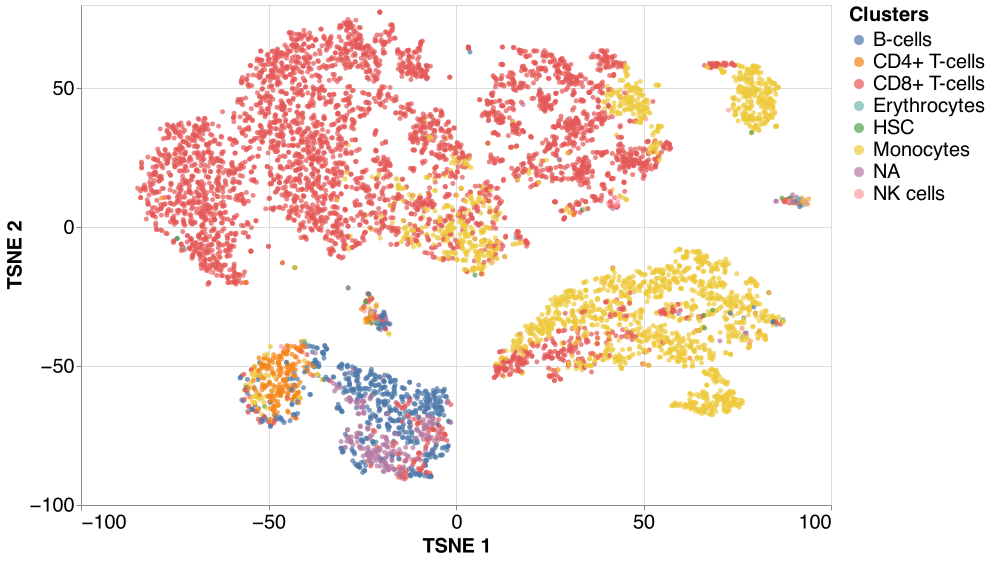

In [31]:
plotdata = DataFrame(TSNE1 = tsneout[:,1], TSNE2 = tsneout[:,2], Celltype = yhat);

p = plotdata |>
@vlplot(width=750,
        height=500,
        :circle, 
        x={:TSNE1, title="TSNE 1", axis={titleFontSize=20, labelFontSize=20, tickCount=5}}, 
        y={:TSNE2, title="TSNE 2", axis={titleFontSize=20, labelFontSize=20, tickCount=5}}, 
        color={"Celltype:n", legend={disable=false, title="Clusters",orient="right"}},
        size={value=25},
        config={legend={titleFontSize=20, labelFontSize=20}}
)

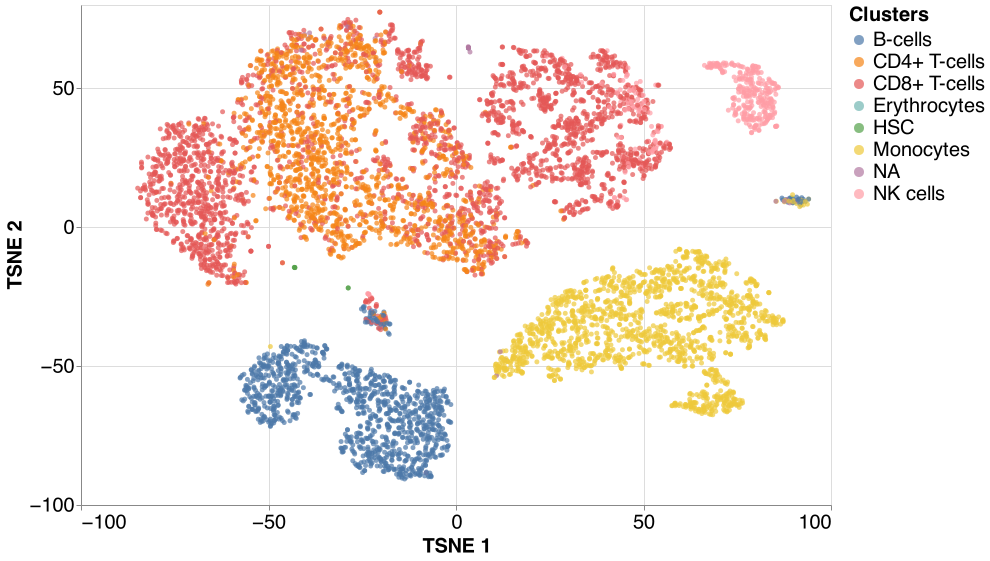

In [32]:
plotdata = DataFrame(TSNE1 = tsneout[:,1], TSNE2 = tsneout[:,2], Celltype = cell_annotation);

p = plotdata |>
@vlplot(width=750,
        height=500,
        :circle, 
        x={:TSNE1, title="TSNE 1", axis={titleFontSize=20, labelFontSize=20, tickCount=5}}, 
        y={:TSNE2, title="TSNE 2", axis={titleFontSize=20, labelFontSize=20, tickCount=5}}, 
        color={"Celltype:n", legend={disable=false, title="Clusters",orient="right"}},
        size={value=25},
        config={legend={titleFontSize=20, labelFontSize=20}}
)

# LDVAE
The same steps as presented for VAEs are shown here as well.

In [33]:
@time xhat = Matrix(CSV.read("samples/xhat_2000_ldvae_posterior.csv", DataFrame,header=false))

  2.754645 seconds (75.62 k allocations: 231.510 MiB)


7480×2000 Array{Float64,2}:
 3.1346     4.68573     0.299176  …  0.0464291  0.00881381  0.272944
 0.0135611  0.0415889   0.882836     0.067973   0.0140892   0.231219
 0.0452587  0.0434514   0.350102     0.0345205  0.00418077  0.0346394
 0.0637072  0.0690753   9.78731      0.202931   0.059313    0.176688
 0.0953827  0.0943493  59.2797       0.0922821  0.0906072   0.16432
 0.0325742  0.0431873   0.264056  …  0.141172   0.0104986   0.0744951
 0.0182831  0.031538    0.517093     0.0749634  0.0105704   0.114866
 0.0487108  0.0618092  10.1022       0.256757   0.0758259   0.254065
 0.028138   0.0424325   0.45877      0.0642679  0.0144968   0.110534
 0.0208385  0.055789    0.941987     0.0874184  0.0104703   0.133275
 0.103747   0.123777   43.4697    …  0.225088   0.115402    0.292313
 0.0319979  0.0472194   0.797653     0.117848   0.0165625   0.12257
 7.06279    8.0893      0.412935     0.0931993  0.00855631  0.192769
 ⋮                                ⋱                         
 0.0264221  0.

In [34]:
@time zhat = Matrix(CSV.read("samples/zhat_2000_ldvae_posterior.csv", DataFrame,header=false))

  0.015584 seconds (470 allocations: 1.739 MiB)


7480×10 Array{Float64,2}:
 -1.44015    -0.91023    1.46973    …  -0.456349    2.05591    -0.957523
  1.72986     0.900255  -1.684         -0.391717    0.031936   -0.827496
 -0.610873    0.35703   -0.327259       2.06706     0.0649069   0.446074
 -0.0465202  -0.556987  -1.31716       -0.762286    0.368111   -0.093975
  0.71431    -1.15443   -0.757331       0.677067    0.306287   -1.18443
 -0.256714   -0.615926  -1.2418     …  -1.0645     -1.03846     0.202657
 -0.554485    1.81639    0.0730981      0.790721   -0.296099    0.0519124
 -0.112071   -0.871821  -1.46372       -1.1304      0.0407204  -0.0719752
 -1.34742     1.1703    -0.897061       0.764293   -0.164409   -0.397728
  2.04162     0.397202   0.35269       -0.408064   -0.787861    0.804641
  0.765085   -1.12111   -0.934093   …  -0.167293    0.0934587  -0.605977
 -0.538692    1.71684   -0.658981       0.344646    0.0899063   0.0742561
 -0.21564    -0.729902   1.06269        0.0547331   2.39808     1.32133
  ⋮                     

In [35]:
xhatbin = VarEnc.dichotomize(xhat,selquantile=.9)
zhatbin = VarEnc.dichotomize(zhat,selquantile=.5)

LoadError: [91mUndefVarError: VarEnc not defined[39m

In [36]:
scvars = select_k_variables(8,[converttoleveldata([xhatbin,zhatbin])],evolution=true)

LoadError: [91mUndefVarError: converttoleveldata not defined[39m

In [37]:
gene_names[scvars[2]]

8-element Array{String,1}:
 "IGLC3"
 "S100A8"
 "FCGR3A"
 "RP11-598F7.3"
 "RGS16"
 "P2RY14"
 "REG4"
 "GZMK"

In [38]:
ldvaegenes = Dict(gene_names[i] => i for i = scvars[2])

Dict{String,Int64} with 8 entries:
  "RP11-598F7.3" => 570
  "REG4"         => 1379
  "S100A8"       => 3
  "GZMK"         => 78
  "IGLC3"        => 1
  "FCGR3A"       => 20
  "RGS16"        => 257
  "P2RY14"       => 925

In [39]:
yhat = annotatesamplesbypattern(xbin,xhatbin,scvars[2],cell_annotation)

7480-element Array{String,1}:
 "B-cells"
 "CD8+ T-cells"
 "CD8+ T-cells"
 "Monocytes"
 "Monocytes"
 "Monocytes"
 "CD8+ T-cells"
 "CD4+ T-cells"
 "CD8+ T-cells"
 "CD8+ T-cells"
 "Monocytes"
 "CD8+ T-cells"
 "Monocytes"
 ⋮
 "CD8+ T-cells"
 "Monocytes"
 "CD8+ T-cells"
 "CD8+ T-cells"
 "CD8+ T-cells"
 "CD8+ T-cells"
 "CD8+ T-cells"
 "CD8+ T-cells"
 "CD8+ T-cells"
 "Monocytes"
 "CD8+ T-cells"
 "CD8+ T-cells"

In [40]:
countmap(yhat)

Dict{String,Int64} with 8 entries:
  "CD4+ T-cells" => 234
  "NA"           => 284
  "B-cells"      => 534
  "HSC"          => 19
  "CD8+ T-cells" => 4263
  "Erythrocytes" => 17
  "Monocytes"    => 2096
  "NK cells"     => 33

In [41]:
tsneout = TSne.tsne(log.(Matrix(xhat) .+ 1))

Computing point perplexities100%|███████████████████████| Time: 0:00:11
Computing t-SNE  0%|                                    |  ETA: 0:12:06
4m  KL_divergence:  5.5944 (warmup)
Computing t-SNE  0%|▏                                   |  ETA: 0:07:18
4m  KL_divergence:  5.5944 (warmup)
Computing t-SNE  0%|▏                                   |  ETA: 0:05:41
4m  KL_divergence:  5.5944 (warmup)
Computing t-SNE  0%|▏                                   |  ETA: 0:04:53
4m  KL_divergence:  5.5944 (warmup)
Computing t-SNE  0%|▏                                   |  ETA: 0:04:23
4m  KL_divergence:  5.5944 (warmup)
Computing t-SNE  1%|▎                                   |  ETA: 0:04:03
4m  KL_divergence:  5.5944 (warmup)
Computing t-SNE  1%|▎                                   |  ETA: 0:03:48
4m  KL_divergence:  5.5944 (warmup)
Computing t-SNE  1%|▎                                   |  ETA: 0:03:38
4m  KL_divergence:  5.5944 (warmup)
Computing t-SNE  1%|▍                                   |  ETA: 

4m  KL_divergence:  4.2468 (warmup)
Computing t-SNE  7%|██▍                                 |  ETA: 0:02:27
4m  KL_divergence:  4.2468 (warmup)
Computing t-SNE  7%|██▍                                 |  ETA: 0:02:27
4m  KL_divergence:  4.2468 (warmup)
Computing t-SNE  7%|██▌                                 |  ETA: 0:02:26
4m  KL_divergence:  4.2468 (warmup)
Computing t-SNE  7%|██▌                                 |  ETA: 0:02:26
4m  KL_divergence:  4.2468 (warmup)
Computing t-SNE  7%|██▌                                 |  ETA: 0:02:26
4m  KL_divergence:  4.2468 (warmup)
Computing t-SNE  7%|██▌                                 |  ETA: 0:02:25
4m  KL_divergence:  4.2468 (warmup)
Computing t-SNE  7%|██▋                                 |  ETA: 0:02:25
4m  KL_divergence:  4.2468 (warmup)
Computing t-SNE  7%|██▋                                 |  ETA: 0:02:25
4m  KL_divergence:  4.2468 (warmup)
Computing t-SNE  7%|██▋                                 |  ETA: 0:02:24
4m  KL_divergence:  4.2468 (

4m  KL_divergence:  4.0061 (warmup)
Computing t-SNE 13%|████▊                               |  ETA: 0:02:13
4m  KL_divergence:  4.0061 (warmup)
Computing t-SNE 13%|████▊                               |  ETA: 0:02:13
4m  KL_divergence:  4.0061 (warmup)
Computing t-SNE 13%|████▊                               |  ETA: 0:02:12
4m  KL_divergence:  4.0061 (warmup)
Computing t-SNE 13%|████▉                               |  ETA: 0:02:12
4m  KL_divergence:  4.0061 (warmup)
Computing t-SNE 14%|████▉                               |  ETA: 0:02:12
4m  KL_divergence:  4.0061 (warmup)
Computing t-SNE 14%|████▉                               |  ETA: 0:02:12
4m  KL_divergence:  4.0061 (warmup)
Computing t-SNE 14%|████▉                               |  ETA: 0:02:12
4m  KL_divergence:  4.0061 (warmup)
Computing t-SNE 14%|█████                               |  ETA: 0:02:12
4m  KL_divergence:  4.0061 (warmup)
Computing t-SNE 14%|█████                               |  ETA: 0:02:11
4m  KL_divergence:  4.0061 (

4m  KL_divergence:  3.9442 (warmup)
Computing t-SNE 20%|███████                             |  ETA: 0:02:02
4m  KL_divergence:  3.9442 (warmup)
Computing t-SNE 20%|███████▏                            |  ETA: 0:02:02
4m  KL_divergence:  3.9442 (warmup)
Computing t-SNE 20%|███████▏                            |  ETA: 0:02:02
4m  KL_divergence:  3.9442 (warmup)
Computing t-SNE 20%|███████▏                            |  ETA: 0:02:02
4m  KL_divergence:  3.9442 (warmup)
Computing t-SNE 20%|███████▎                            |  ETA: 0:02:02
4m  KL_divergence:  3.9148 (warmup)
Computing t-SNE 20%|███████▎                            |  ETA: 0:02:02
4m  KL_divergence:  3.9148 (warmup)
Computing t-SNE 20%|███████▎                            |  ETA: 0:02:02
4m  KL_divergence:  3.9148 (warmup)
Computing t-SNE 20%|███████▎                            |  ETA: 0:02:02
4m  KL_divergence:  3.9148 (warmup)
Computing t-SNE 20%|███████▍                            |  ETA: 0:02:02
4m  KL_divergence:  3.9148 (

4m  KL_divergence:  3.8975
Computing t-SNE 26%|█████████▍                          |  ETA: 0:01:52
4m  KL_divergence:  3.8975
Computing t-SNE 26%|█████████▌                          |  ETA: 0:01:52
4m  KL_divergence:  3.8975
Computing t-SNE 26%|█████████▌                          |  ETA: 0:01:52
4m  KL_divergence:  3.8975
Computing t-SNE 26%|█████████▌                          |  ETA: 0:01:52
4m  KL_divergence:  3.8975
Computing t-SNE 27%|█████████▋                          |  ETA: 0:01:52
4m  KL_divergence:  3.8975
Computing t-SNE 27%|█████████▋                          |  ETA: 0:01:51
4m  KL_divergence:  3.8975
Computing t-SNE 27%|█████████▋                          |  ETA: 0:01:51
4m  KL_divergence:  3.8975
Computing t-SNE 27%|█████████▋                          |  ETA: 0:01:51
4m  KL_divergence:  3.8975
Computing t-SNE 27%|█████████▊                          |  ETA: 0:01:51
4m  KL_divergence:  3.8975
Computing t-SNE 27%|█████████▊                          |  ETA: 0:01:51
4m  KL_div

4m  KL_divergence:  2.4824
Computing t-SNE 33%|████████████                        |  ETA: 0:01:43
4m  KL_divergence:  2.4824
Computing t-SNE 33%|████████████                        |  ETA: 0:01:43
4m  KL_divergence:  2.4824
Computing t-SNE 33%|████████████                        |  ETA: 0:01:43
4m  KL_divergence:  2.4824
Computing t-SNE 34%|████████████                        |  ETA: 0:01:43
4m  KL_divergence:  2.4824
Computing t-SNE 34%|████████████▏                       |  ETA: 0:01:43
4m  KL_divergence:  2.4824
Computing t-SNE 34%|████████████▏                       |  ETA: 0:01:42
4m  KL_divergence:  2.4824
Computing t-SNE 34%|████████████▏                       |  ETA: 0:01:42
4m  KL_divergence:  2.4824
Computing t-SNE 34%|████████████▎                       |  ETA: 0:01:42
4m  KL_divergence:  2.4824
Computing t-SNE 34%|████████████▎                       |  ETA: 0:01:42
4m  KL_divergence:  2.4824
Computing t-SNE 34%|████████████▎                       |  ETA: 0:01:42
4m  KL_div

4m  KL_divergence:  1.9320
Computing t-SNE 40%|██████████████▌                     |  ETA: 0:01:34
4m  KL_divergence:  1.9320
Computing t-SNE 40%|██████████████▌                     |  ETA: 0:01:34
4m  KL_divergence:  1.9320
Computing t-SNE 40%|██████████████▌                     |  ETA: 0:01:34
4m  KL_divergence:  1.9320
Computing t-SNE 40%|██████████████▋                     |  ETA: 0:01:33
4m  KL_divergence:  1.9320
Computing t-SNE 41%|██████████████▋                     |  ETA: 0:01:33
4m  KL_divergence:  1.9320
Computing t-SNE 41%|██████████████▋                     |  ETA: 0:01:33
4m  KL_divergence:  1.9320
Computing t-SNE 41%|██████████████▊                     |  ETA: 0:01:33
4m  KL_divergence:  1.9320
Computing t-SNE 41%|██████████████▊                     |  ETA: 0:01:33
4m  KL_divergence:  1.9320
Computing t-SNE 41%|██████████████▊                     |  ETA: 0:01:33
4m  KL_divergence:  1.9320
Computing t-SNE 41%|██████████████▊                     |  ETA: 0:01:33
4m  KL_div

4m  KL_divergence:  1.8282
Computing t-SNE 47%|█████████████████                   |  ETA: 0:01:24
4m  KL_divergence:  1.8282
Computing t-SNE 47%|█████████████████                   |  ETA: 0:01:24
4m  KL_divergence:  1.8282
Computing t-SNE 47%|█████████████████▏                  |  ETA: 0:01:23
4m  KL_divergence:  1.8282
Computing t-SNE 48%|█████████████████▏                  |  ETA: 0:01:23
4m  KL_divergence:  1.8282
Computing t-SNE 48%|█████████████████▏                  |  ETA: 0:01:23
4m  KL_divergence:  1.8282
Computing t-SNE 48%|█████████████████▏                  |  ETA: 0:01:23
4m  KL_divergence:  1.8282
Computing t-SNE 48%|█████████████████▎                  |  ETA: 0:01:23
4m  KL_divergence:  1.8282
Computing t-SNE 48%|█████████████████▎                  |  ETA: 0:01:23
4m  KL_divergence:  1.8282
Computing t-SNE 48%|█████████████████▎                  |  ETA: 0:01:22
4m  KL_divergence:  1.8282
Computing t-SNE 48%|█████████████████▍                  |  ETA: 0:01:22
4m  KL_div

4m  KL_divergence:  1.7593
Computing t-SNE 54%|███████████████████▌                |  ETA: 0:01:13
4m  KL_divergence:  1.7593
Computing t-SNE 54%|███████████████████▌                |  ETA: 0:01:13
4m  KL_divergence:  1.7593
Computing t-SNE 54%|███████████████████▋                |  ETA: 0:01:13
4m  KL_divergence:  1.7593
Computing t-SNE 54%|███████████████████▋                |  ETA: 0:01:13
4m  KL_divergence:  1.7593
Computing t-SNE 55%|███████████████████▋                |  ETA: 0:01:13
4m  KL_divergence:  1.7593
Computing t-SNE 55%|███████████████████▊                |  ETA: 0:01:12
4m  KL_divergence:  1.7593
Computing t-SNE 55%|███████████████████▊                |  ETA: 0:01:12
4m  KL_divergence:  1.7593
Computing t-SNE 55%|███████████████████▊                |  ETA: 0:01:12
4m  KL_divergence:  1.7593
Computing t-SNE 55%|███████████████████▊                |  ETA: 0:01:12
4m  KL_divergence:  1.7107
Computing t-SNE 55%|███████████████████▉                |  ETA: 0:01:12
4m  KL_div

4m  KL_divergence:  1.6748
Computing t-SNE 61%|██████████████████████              |  ETA: 0:01:03
4m  KL_divergence:  1.6748
Computing t-SNE 61%|██████████████████████▏             |  ETA: 0:01:02
4m  KL_divergence:  1.6748
Computing t-SNE 61%|██████████████████████▏             |  ETA: 0:01:02
4m  KL_divergence:  1.6748
Computing t-SNE 62%|██████████████████████▏             |  ETA: 0:01:02
4m  KL_divergence:  1.6748
Computing t-SNE 62%|██████████████████████▏             |  ETA: 0:01:02
4m  KL_divergence:  1.6748
Computing t-SNE 62%|██████████████████████▎             |  ETA: 0:01:02
4m  KL_divergence:  1.6748
Computing t-SNE 62%|██████████████████████▎             |  ETA: 0:01:02
4m  KL_divergence:  1.6748
Computing t-SNE 62%|██████████████████████▎             |  ETA: 0:01:01
4m  KL_divergence:  1.6748
Computing t-SNE 62%|██████████████████████▍             |  ETA: 0:01:01
4m  KL_divergence:  1.6748
Computing t-SNE 62%|██████████████████████▍             |  ETA: 0:01:01
4m  KL_div

4m  KL_divergence:  1.6473
Computing t-SNE 68%|████████████████████████▌           |  ETA: 0:00:52
4m  KL_divergence:  1.6473
Computing t-SNE 68%|████████████████████████▋           |  ETA: 0:00:51
4m  KL_divergence:  1.6473
Computing t-SNE 68%|████████████████████████▋           |  ETA: 0:00:51
4m  KL_divergence:  1.6473
Computing t-SNE 68%|████████████████████████▋           |  ETA: 0:00:51
4m  KL_divergence:  1.6473
Computing t-SNE 69%|████████████████████████▊           |  ETA: 0:00:51
4m  KL_divergence:  1.6473
Computing t-SNE 69%|████████████████████████▊           |  ETA: 0:00:51
4m  KL_divergence:  1.6473
Computing t-SNE 69%|████████████████████████▊           |  ETA: 0:00:51
4m  KL_divergence:  1.6473
Computing t-SNE 69%|████████████████████████▊           |  ETA: 0:00:50
4m  KL_divergence:  1.6473
Computing t-SNE 69%|████████████████████████▉           |  ETA: 0:00:50
4m  KL_divergence:  1.6473
Computing t-SNE 69%|████████████████████████▉           |  ETA: 0:00:50
4m  KL_div

4m  KL_divergence:  1.6083
Computing t-SNE 75%|███████████████████████████▏        |  ETA: 0:00:40
4m  KL_divergence:  1.6083
Computing t-SNE 75%|███████████████████████████▏        |  ETA: 0:00:40
4m  KL_divergence:  1.6083
Computing t-SNE 75%|███████████████████████████▏        |  ETA: 0:00:40
4m  KL_divergence:  1.6083
Computing t-SNE 76%|███████████████████████████▏        |  ETA: 0:00:40
4m  KL_divergence:  1.6083
Computing t-SNE 76%|███████████████████████████▎        |  ETA: 0:00:39
4m  KL_divergence:  1.6083
Computing t-SNE 76%|███████████████████████████▎        |  ETA: 0:00:39
4m  KL_divergence:  1.6083
Computing t-SNE 76%|███████████████████████████▎        |  ETA: 0:00:39
4m  KL_divergence:  1.6083
Computing t-SNE 76%|███████████████████████████▍        |  ETA: 0:00:39
4m  KL_divergence:  1.6083
Computing t-SNE 76%|███████████████████████████▍        |  ETA: 0:00:39
4m  KL_divergence:  1.6083
Computing t-SNE 76%|███████████████████████████▍        |  ETA: 0:00:39
4m  KL_div

4m  KL_divergence:  1.5940
Computing t-SNE 82%|█████████████████████████████▋      |  ETA: 0:00:29
4m  KL_divergence:  1.5940
Computing t-SNE 82%|█████████████████████████████▋      |  ETA: 0:00:29
4m  KL_divergence:  1.5940
Computing t-SNE 82%|█████████████████████████████▋      |  ETA: 0:00:28
4m  KL_divergence:  1.5940
Computing t-SNE 82%|█████████████████████████████▊      |  ETA: 0:00:28
4m  KL_divergence:  1.5940
Computing t-SNE 83%|█████████████████████████████▊      |  ETA: 0:00:28
4m  KL_divergence:  1.5940
Computing t-SNE 83%|█████████████████████████████▊      |  ETA: 0:00:28
4m  KL_divergence:  1.5940
Computing t-SNE 83%|█████████████████████████████▊      |  ETA: 0:00:28
4m  KL_divergence:  1.5940
Computing t-SNE 83%|█████████████████████████████▉      |  ETA: 0:00:28
4m  KL_divergence:  1.5940
Computing t-SNE 83%|█████████████████████████████▉      |  ETA: 0:00:27
4m  KL_divergence:  1.5940
Computing t-SNE 83%|█████████████████████████████▉      |  ETA: 0:00:27
4m  KL_div

4m  KL_divergence:  1.5821
Computing t-SNE 89%|████████████████████████████████▏   |  ETA: 0:00:17
4m  KL_divergence:  1.5821
Computing t-SNE 89%|████████████████████████████████▏   |  ETA: 0:00:17
4m  KL_divergence:  1.5821
Computing t-SNE 89%|████████████████████████████████▏   |  ETA: 0:00:17
4m  KL_divergence:  1.5821
Computing t-SNE 90%|████████████████████████████████▎   |  ETA: 0:00:17
4m  KL_divergence:  1.5821
Computing t-SNE 90%|████████████████████████████████▎   |  ETA: 0:00:17
4m  KL_divergence:  1.5821
Computing t-SNE 90%|████████████████████████████████▎   |  ETA: 0:00:17
4m  KL_divergence:  1.5821
Computing t-SNE 90%|████████████████████████████████▍   |  ETA: 0:00:16
4m  KL_divergence:  1.5821
Computing t-SNE 90%|████████████████████████████████▍   |  ETA: 0:00:16
4m  KL_divergence:  1.5821
Computing t-SNE 90%|████████████████████████████████▍   |  ETA: 0:00:16
4m  KL_divergence:  1.5720
Computing t-SNE 90%|████████████████████████████████▍   |  ETA: 0:00:16
4m  KL_div

4m  KL_divergence:  1.5634
Computing t-SNE 96%|██████████████████████████████████▋ |  ETA: 0:00:06
4m  KL_divergence:  1.5634
Computing t-SNE 96%|██████████████████████████████████▋ |  ETA: 0:00:06
4m  KL_divergence:  1.5634
Computing t-SNE 96%|██████████████████████████████████▊ |  ETA: 0:00:06
4m  KL_divergence:  1.5634
Computing t-SNE 96%|██████████████████████████████████▊ |  ETA: 0:00:06
4m  KL_divergence:  1.5634
Computing t-SNE 97%|██████████████████████████████████▊ |  ETA: 0:00:05
4m  KL_divergence:  1.5634
Computing t-SNE 97%|██████████████████████████████████▊ |  ETA: 0:00:05
4m  KL_divergence:  1.5634
Computing t-SNE 97%|██████████████████████████████████▉ |  ETA: 0:00:05
4m  KL_divergence:  1.5634
Computing t-SNE 97%|██████████████████████████████████▉ |  ETA: 0:00:05
4m  KL_divergence:  1.5634
Computing t-SNE 97%|██████████████████████████████████▉ |  ETA: 0:00:05
4m  KL_divergence:  1.5634
Computing t-SNE 97%|███████████████████████████████████ |  ETA: 0:00:05
4m  KL_div

7480×2 Array{Float64,2}:
  52.5787   -63.1216
 -29.1839    22.4225
 -17.8871   -55.1868
  22.8263    43.7232
  38.2629    55.7254
 -76.5058    13.1521
   4.87274    7.51703
  49.9711    32.4946
  15.0827   -10.2254
 -44.5906   -14.2966
  54.847     42.0076
  12.09      14.0025
  61.7928   -23.7812
   ⋮        
 -19.2037   -60.4221
 -18.5256    31.8818
 -53.8305    29.1928
 -72.306    -12.4173
   4.17889  -37.6229
  14.2872    66.576
  26.5249    -8.82949
 -28.1571   -46.3253
 -34.8267   -38.9475
  49.0479    45.1993
 -25.6346    -3.72974
  22.6987   -22.939

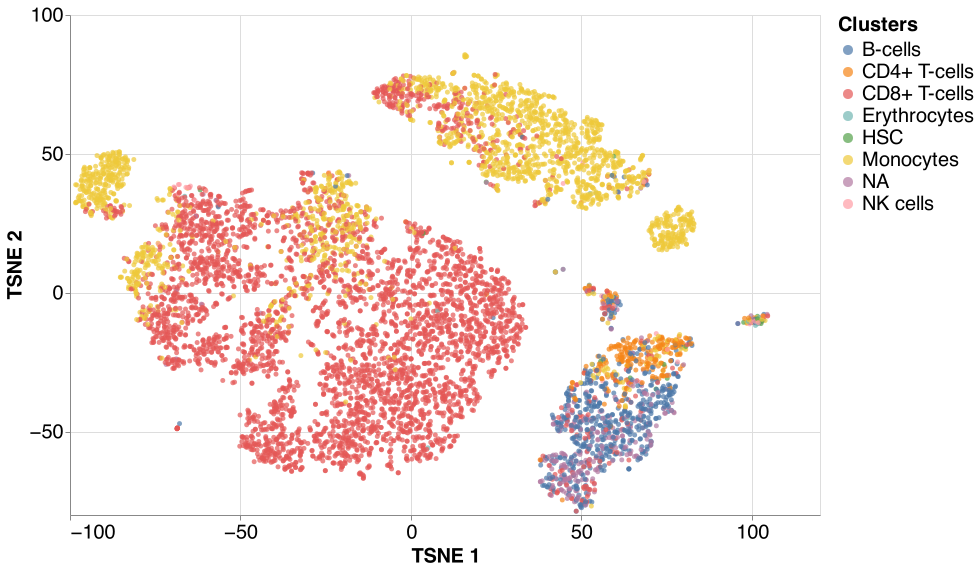

In [42]:
plotdata = DataFrame(TSNE1 = tsneout[:,1], TSNE2 = tsneout[:,2], Celltype = yhat);

p = plotdata |>
@vlplot(width=750,
        height=500,
        :circle, 
        x={:TSNE1, title="TSNE 1", axis={titleFontSize=20, labelFontSize=20, tickCount=5}}, 
        y={:TSNE2, title="TSNE 2", axis={titleFontSize=20, labelFontSize=20, tickCount=5}}, 
        color={"Celltype:n", legend={disable=false, title="Clusters",orient="right"}},
        size={value=25},
        config={legend={titleFontSize=20, labelFontSize=20}}
)

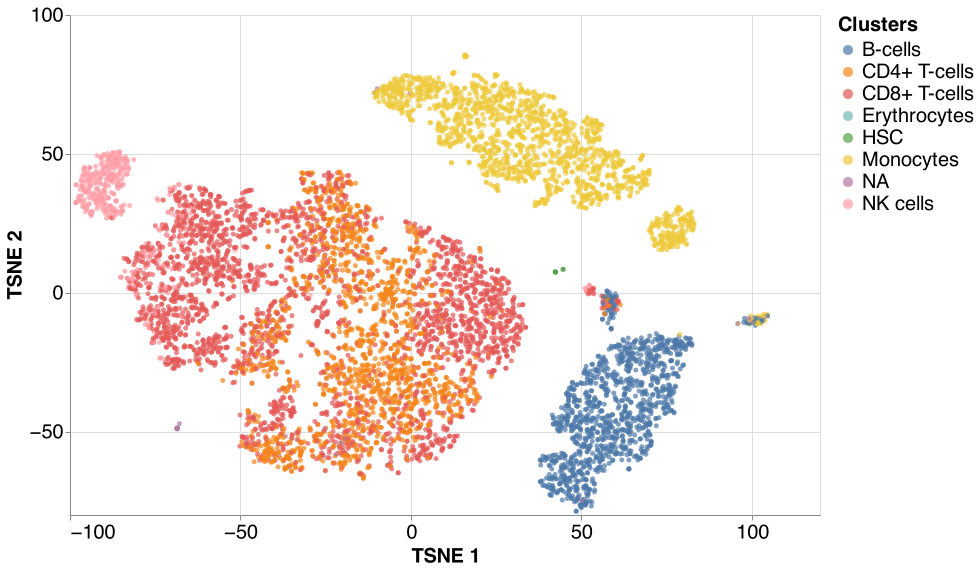

In [43]:
plotdata = DataFrame(TSNE1 = tsneout[:,1], TSNE2 = tsneout[:,2], Celltype = cell_annotation);

p = plotdata |>
@vlplot(width=750,
        height=500,
        :circle, 
        x={:TSNE1, title="TSNE 1", axis={titleFontSize=20, labelFontSize=20, tickCount=5}}, 
        y={:TSNE2, title="TSNE 2", axis={titleFontSize=20, labelFontSize=20, tickCount=5}}, 
        color={"Celltype:n", legend={disable=false, title="Clusters",orient="right"}},
        size={value=25},
        config={legend={titleFontSize=20, labelFontSize=20}}
)

## Inspecting the expression of selected genes
Having selected the essential genes, we could now inspect, how these are expressed in different cell types.

In [45]:
vaegenes

LoadError: [91mUndefVarError: vaegenes not defined[39m

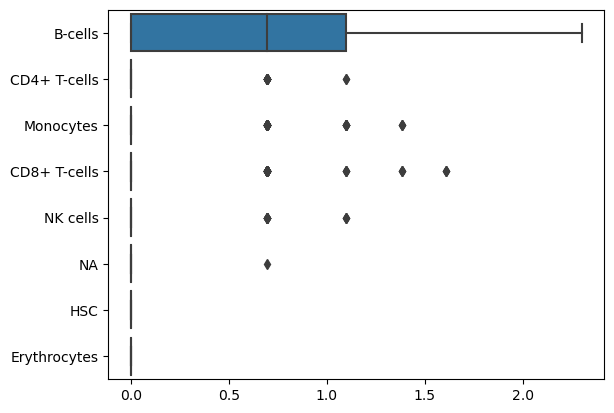

PyObject <AxesSubplot:>

In [57]:
Seaborn.boxplot(x=log.(x[:,vaegenes["LINC00926"]] .+1),y=cell_annotation)

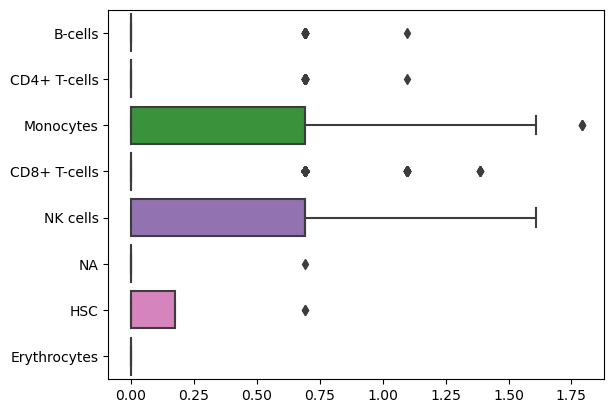

PyObject <AxesSubplot:>

In [58]:
Seaborn.boxplot(x=log.(x[:,vaegenes["CD300A"]] .+1),y=cell_annotation)

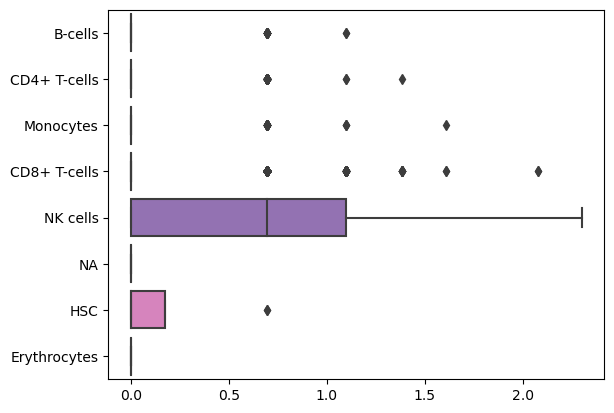

PyObject <AxesSubplot:>

In [62]:
Seaborn.boxplot(x=log.(x[:,vaegenes["IL2RB"]] .+1),y=cell_annotation)